In [1]:
import os
import pandas as pd
import preprocess
import cv2
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions

pd.set_option("display.max_rows",999)
np.random.seed(42)

Using TensorFlow backend.


In [2]:

DATA_DIR_PATH = preprocess.DATA_DIR_PATH
NUM_CLASSES = 120

In [3]:
labels = pd.read_csv(os.path.join(preprocess.DATA_DIR, 'labels.csv'))

def get_img_cls_from_id(img_id):
    return labels[labels.id == img_id]['breed'].values[0]

### Breed by Frequency, Note classes are imbalanced

In [4]:
labels.groupby('breed').count().sort_values(by='id', ascending=False)

,id
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
shih-tzu,112
great_pyrenees,111
pomeranian,111
basenji,110


In [5]:
def read_image_as_rbg(img_id = None, shape = None):
    #img_id = '0a0c223352985ec154fd604d7ddceabd'
    img_BGR = cv2.imread(os.path.join(DATA_DIR_PATH, 'train', f'{img_id}.jpg'))
    if shape is not None:
        img_BGR = cv2.resize(img_BGR, shape)
    return cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

In [6]:
#labels[labels.breed == 'scottish_deerhound'].id.tolist()[:5]

In [7]:
#4 Breed I chose fo fun
breeds = ['scottish_deerhound', 'maltese_dog', 'pomeranian', 'cocker_spaniel']

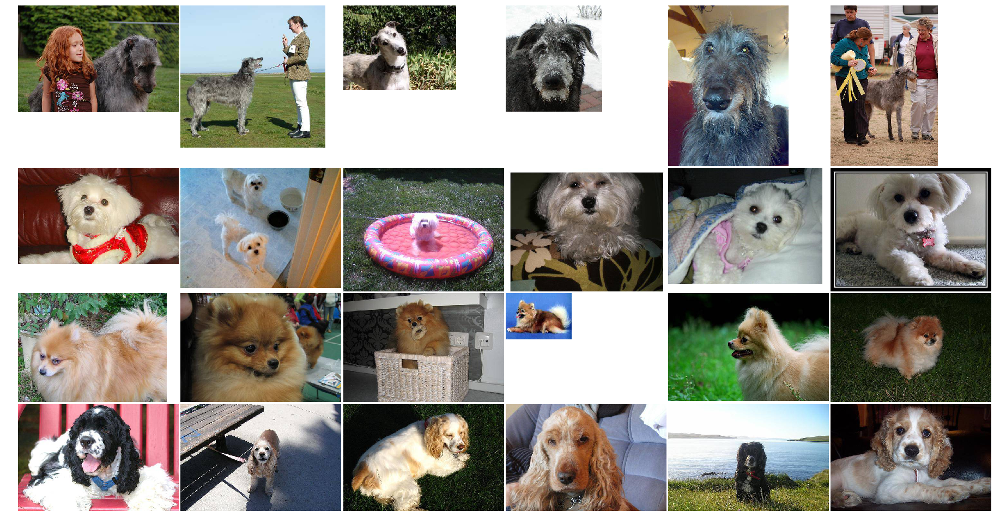

In [8]:
NUM_SAMPLE_PER_BREED = 6

fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(len(breeds), NUM_SAMPLE_PER_BREED), axes_pad=0.05)

idx = 0
for breed in breeds:
    for img_id in labels[labels.breed == breed].id.tolist()[:6]:
        ax = grid[idx]
        img = read_image_as_rbg(img_id=img_id)
        ax.imshow(img)
        ax.axis('off')
        idx += 1
plt.show()

### there already exists a model for classifying Maltese Dogs and Scottish Deerhounds

We can use the weights of any model that's been trained on imagenet keras comes with some pre-trained "classical" models that are trained on existing datasets VGG16 is a "16-layer network used by the VGG team in the ILSVRC-2014 competition"

TODO: show image of the model

![title](vgg16.png)

In [9]:
model_vgg16 = VGG16(weights='imagenet')

In [10]:
img_id = '0042188c895a2f14ef64a918ed9c7b64'

In [11]:
img = read_image_as_rbg(img_id=img_id, shape = (224, 224))
print(img.shape, img.max(), img.min())

(224, 224, 3) 254 0


In [12]:
x = preprocess_input(np.expand_dims(img.copy() + 0.0, axis = 0)) #return (1, 224, 224, 3)
preds = model_vgg16.predict(x)

In [13]:
res = decode_predictions(preds, top=2)
res

[[('n02092002', 'Scottish_deerhound', 0.78298795),
  ('n02090721', 'Irish_wolfhound', 0.19540323)]]

In [14]:
def plot_image_and_labels(img_arr, true_cls, pred1, pred2):
    _, cls1, prob1 = pred1
    _,cls2, prob2 = pred2
#     cls, prob = 'Scottish_deerhound', 0.78298694
#     breed = 'scottish'
    plt.imshow(img)
    plt.text(10, 200, 'Predicted: %s (%.3f)' % (cls1 , prob1), color='w', backgroundcolor='k', alpha=0.8)
    plt.text(10, 220, 'Predicted: %s (%.3f)' % (cls2 , prob2), color='w', backgroundcolor='k', alpha=0.8)
    plt.text(10, 15, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
    plt.axis('off')
    plt.show()

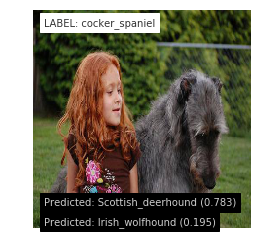

In [15]:
plot_image_and_labels(x, get_img_cls_from_id(img_id), pred1 = res[0][0], pred2=res[0][1])

starting scottish_deerhound
starting maltese_dog
starting pomeranian
starting cocker_spaniel


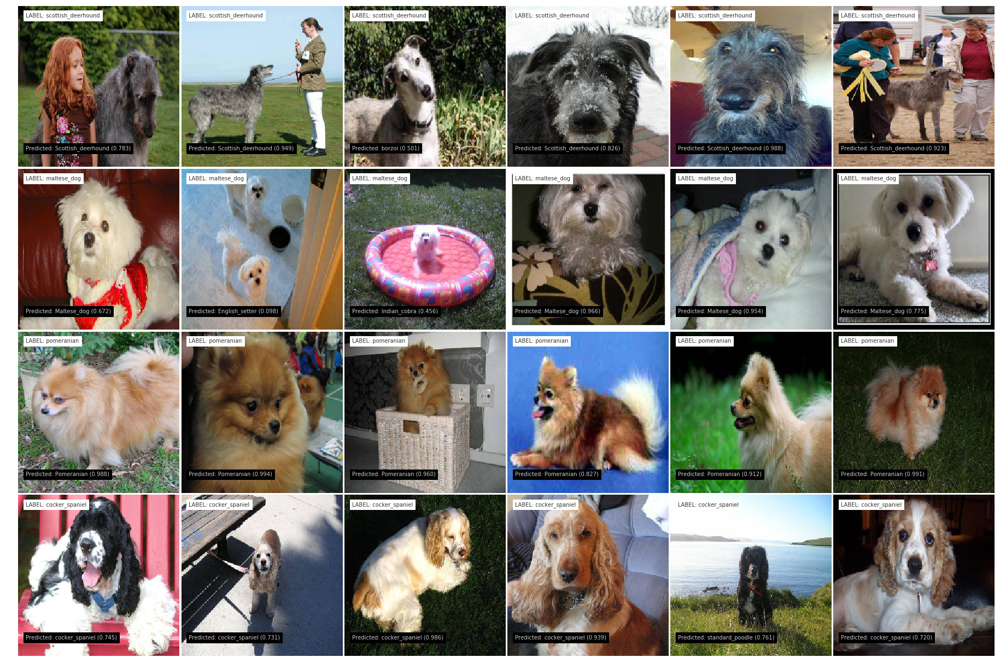

In [16]:
NUM_SAMPLE_PER_BREED = 6

fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(len(breeds), NUM_SAMPLE_PER_BREED), axes_pad=0.05)

idx = 0
for breed in breeds:
    print('starting', breed)
    for img_id in labels[labels.breed == breed].id.tolist()[:6]:
        ax = grid[idx]
        img = read_image_as_rbg(img_id=img_id, shape = (224, 224))
        x = preprocess_input(np.expand_dims(img.copy().astype(float), axis = 0)) #return (1, 224, 224, 3)
        preds = model_vgg16.predict(x)
        _, cls, prob = decode_predictions(preds, top=1)[0][0]
        ax.imshow(img)
        ax.text(10, 200, 'Predicted: %s (%.3f)' % (cls , prob), color='w', backgroundcolor='k', alpha=0.8)
        ax.text(10, 15, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
        ax.axis('off')
        idx += 1
plt.show()

### Create Training and Test Dataset

In [17]:
tmp = np.vstack( (np.array([1,1,1]), np.array([0,0,0])) )
tmp.sum(axis = 0)

array([1, 1, 1])

In [18]:
x_train_list_id = []
y_train_labels = None
BREED_TO_IDX_MAP = { breed:idx for idx, breed in enumerate(breeds)}
IDX_TO_BREED_MAP = { idx:breed for idx, breed in enumerate(breeds)}

for idx, breed in enumerate(breeds):
    BREED_TO_IDX_MAP[breed] = idx
    breed_list = labels[labels.breed == breed].id.tolist() 
    num_ids = len(breed_list)
    
    breed_y = np.zeros((len(breed_list), len(breeds)))
    breed_y[:, idx] = 1 #mark response for this breed at this index
    
    
    x_train_list_id.extend( breed_list )
    
    print(len(breed_list), breed_y.shape)

    if y_train_labels is None:
        y_train_labels = breed_y
    else:
        y_train_labels = np.vstack( (y_train_labels, breed_y) )

        
print(BREED_TO_IDX_MAP)
print(IDX_TO_BREED_MAP)
print(len(x_train_list_id), y_train_labels.shape, y_train_labels.sum(axis = 0))
    

126 (126, 4)
117 (117, 4)
111 (111, 4)
74 (74, 4)
{'scottish_deerhound': 0, 'maltese_dog': 1, 'pomeranian': 2, 'cocker_spaniel': 3}
{0: 'scottish_deerhound', 1: 'maltese_dog', 2: 'pomeranian', 3: 'cocker_spaniel'}
428 (428, 4) [ 126.  117.  111.   74.]


In [19]:
def decode_arr(input_arr):
    """
    input_arr: vector of size 4
    """
    assert input_arr.shape == (4,), 'input wrong shape'
    return IDX_TO_BREED_MAP[input_arr.argmax()]
    
    

### Make Matrix of training images scaled to 200 by 200

In [20]:
def get_image_matrix_from_ids(list_of_ids, output_size = (200, 200)):
    img_matrix = np.zeros((len(list_of_ids), output_size[0], output_size[1], 3), dtype='float32') #stores all of the images in a 4 dim tensor  
    for idx, img_id in enumerate(list_of_ids):
        img = read_image_as_rbg(img_id=img_id, shape=output_size)
        img_matrix[idx] = img
    return img_matrix

In [21]:
x_train = get_image_matrix_from_ids(x_train_list_id)

In [22]:
def normalize_images(img_tensor):
    return (img_tensor - 128.0)/ 128.0 #scales all values to -1.0 to 1.0

In [23]:
NUM_SAMPLES = x_train.shape[0]

idx_arr =  np.arange(NUM_SAMPLES)
np.random.shuffle(idx_arr)
print('sample of random array', idx_arr[:25])

train_arr = idx_arr[:int(NUM_SAMPLES * 0.8)]
valid_arr = idx_arr[int(NUM_SAMPLES * 0.8):]

X_train_arr = x_train[train_arr]
X_valid_arr = x_train[valid_arr]

y_train_arr = y_train_labels[train_arr]
y_valid_arr = y_train_labels[valid_arr]

print(X_train_arr.shape, y_train_arr.shape)
print(y_train_arr.sum(axis = 0))

print(y_valid_arr.sum(axis = 0))

sample of random array [305 249 247  74  59 261 373 378 187 392 193 165 352 103 369 405 327 107
   5 151  58   4 234 217 348]
(342, 200, 200, 3) (342, 4)
[ 99.  96.  90.  57.]
[ 27.  21.  21.  17.]


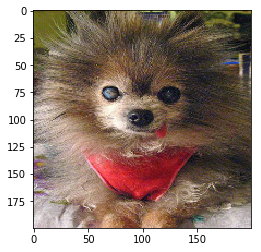

pomeranian


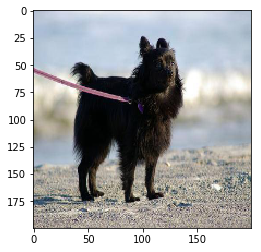

pomeranian


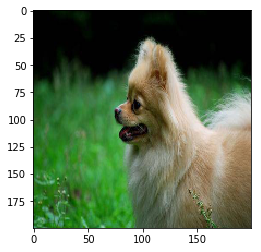

pomeranian


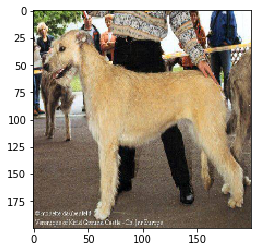

scottish_deerhound


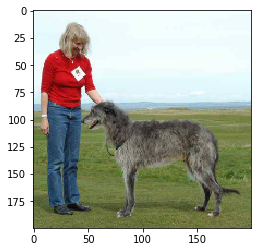

scottish_deerhound


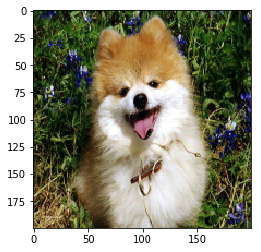

pomeranian


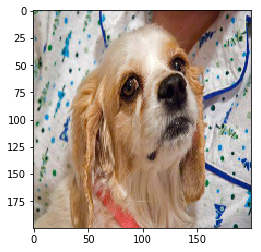

cocker_spaniel


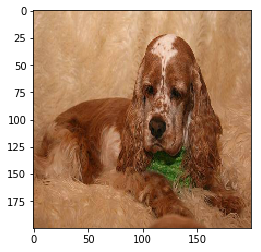

cocker_spaniel


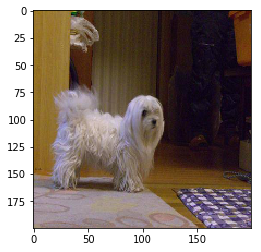

maltese_dog


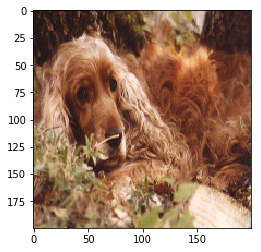

cocker_spaniel


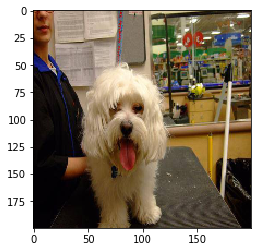

maltese_dog


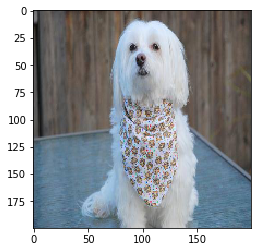

maltese_dog


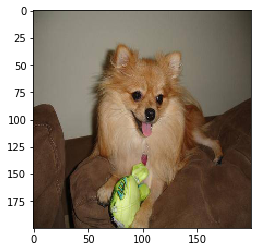

pomeranian


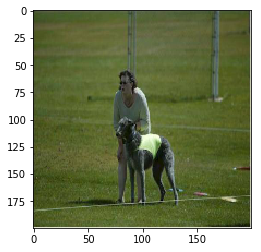

scottish_deerhound


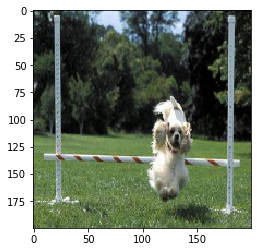

cocker_spaniel


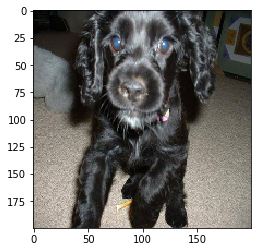

cocker_spaniel


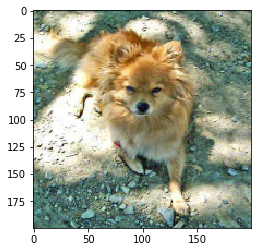

pomeranian


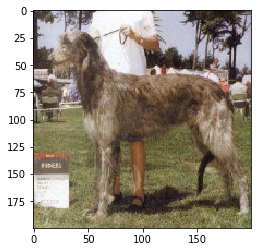

scottish_deerhound


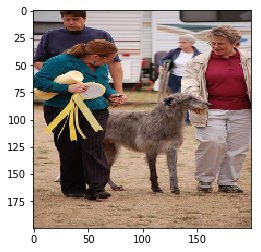

scottish_deerhound


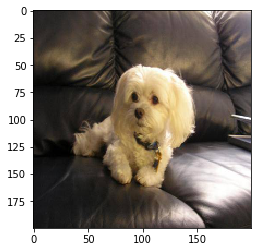

maltese_dog


In [24]:
for i in range(20):
    plt.imshow(X_train_arr[i].astype('uint8'))
    plt.show()
    print(decode_arr(y_train_arr[i]))

In [25]:
decode_arr(y_train_arr[20])

'scottish_deerhound'

In [26]:
import numpy as np
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD
import time

In [27]:
#model.reset_states()

In [28]:
#based on mnist architecture and way too slow to train

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #usually this variable is 2, 2
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(4, activation='softmax'))

sgd = SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy', optimizer=sgd)
model.summary()
#model.fit(x_train, y_train, batch_size=32, epochs=10)
#score = model.evaluate(x_test, y_test, batch_size=32)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 198, 198, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 196, 196, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 98, 98, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 96, 96, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 94, 94, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 47, 47, 64)        0         
__________

In [29]:
X_train_arr_norm = normalize_images(X_train_arr)
X_valid_arr_norm = normalize_images(X_valid_arr)

In [30]:
def make_confusion_matrix(pred, actual, num_classes):
    cm = np.zeros((num_classes, num_classes))
    num_results = pred.shape[0]
    for i in range(num_results):
        cm[pred[i], actual[i]] += 1.0
    return cm

In [31]:
start = time.time()
num_round = 20
num_epochs_per_round = 10
print('Total Number of Epochs')
for i in range(num_round):
    print('Training Step: ', i)
    model.fit(X_train_arr_norm, y_train_arr, batch_size=32, epochs=num_epochs_per_round)
    pred_prob = model.predict_proba(X_valid_arr_norm)
    
    acc = (pred_prob.argmax(axis = 1) == y_valid_arr.argmax(axis = 1)).astype('float32').mean()
    loss = model.evaluate(X_valid_arr, y_valid_arr, batch_size=32)
    #print(pred_prob.round(3))
    print('Summary Stats on Predictions:')
    print(pred_prob.min(axis = 0))
    print(pred_prob.max(axis = 0))
    print(pred_prob.mean(axis = 0))
    print(pred_prob.std(axis = 0))
    print(make_confusion_matrix(pred_prob.argmax(axis = 1),  y_valid_arr.argmax(axis = 1), 4))
    print('Prediction Validation Accuracy and Loss', acc, loss)
    
print('Total Elapsed Time', time.time() - start)

Total Number of Epochs
Training Step:  0
Epoch 1/10
342/342 [==============================] - 21s 61ms/step - loss: 1.3859
Epoch 2/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3850
Epoch 3/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3803
Epoch 4/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3756
Epoch 5/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3712
Epoch 6/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3769
Epoch 7/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3677
Epoch 8/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3652
Epoch 9/10
342/342 [==============================] - 9s 25ms/step - loss: 1.3694
Epoch 10/10
86/86 [==============================] - 1s 8ms/step
Summary Stats on Predictions:
[ 0.26497039  0.26130179  0.25325996  0.20459194]
[ 0.27686045  0.26800776  0.25770822  0.21354012]
[ 0.27139843  0.26512891 

342/342 [==============================] - 9s 25ms/step - loss: 1.0947
Epoch 4/10
342/342 [==============================] - 9s 25ms/step - loss: 1.1039
Epoch 5/10
342/342 [==============================] - 9s 25ms/step - loss: 1.0868
Epoch 6/10
342/342 [==============================] - 9s 25ms/step - loss: 1.0714
Epoch 7/10
342/342 [==============================] - 9s 25ms/step - loss: 1.0426
Epoch 8/10
342/342 [==============================] - 9s 25ms/step - loss: 1.0241
Epoch 9/10
342/342 [==============================] - 9s 25ms/step - loss: 1.0087
Epoch 10/10
86/86 [==============================] - 1s 7ms/step
Summary Stats on Predictions:
[ 0.04348349  0.05722236  0.07477614  0.03308731]
[ 0.65489495  0.79584235  0.64062941  0.28761911]
[ 0.24881241  0.34185791  0.26387024  0.14545956]
[ 0.18946201  0.22221836  0.15025102  0.0745915 ]
[[ 21.   1.   2.   9.]
 [  2.  18.   8.   1.]
 [  4.   2.  11.   7.]
 [  0.   0.   0.   0.]]
Prediction Validation Accuracy and Loss 0.581395 

342/342 [==============================] - 9s 25ms/step - loss: 0.2727
Epoch 7/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2484
Epoch 8/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2515
Epoch 9/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2720
Epoch 10/10
86/86 [==============================] - 1s 7ms/step
Summary Stats on Predictions:
[  1.38587808e-08   1.64192716e-06   9.81597736e-07   3.68272772e-08]
[ 0.99846125  0.99999833  0.99518698  0.99233001]
[ 0.27576944  0.34647632  0.21956715  0.15818715]
[ 0.37989536  0.40585241  0.33144945  0.24447714]
[[ 18.   1.   2.   6.]
 [  2.  18.   8.   1.]
 [  1.   2.  11.   5.]
 [  6.   0.   0.   5.]]
Prediction Validation Accuracy and Loss 0.604651 8.85708950841
Training Step:  19
Epoch 1/10
342/342 [==============================] - 9s 25ms/step - loss: 0.3126
Epoch 2/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2616
Epoch 3/10
342/342 [=========

# Save model state

In [36]:
model.save('dog_breed_demo-arch-1-epoch-200.h5')

In [40]:
import json
json.dump(model.to_json(), open('arch-1.json', 'w'))

# review residuals

predicted:  maltese_dog 0.620258
actual:  pomeranian


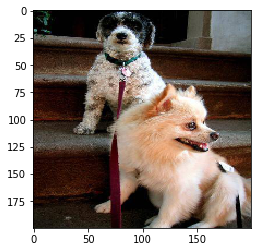

predicted:  cocker_spaniel 0.396711
actual:  scottish_deerhound


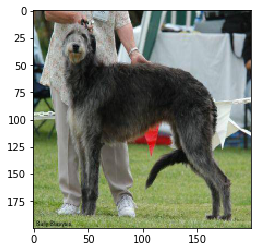

predicted:  maltese_dog 0.999883
actual:  pomeranian


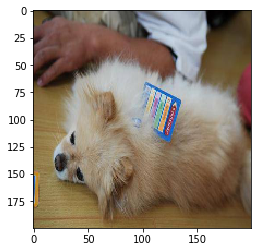

predicted:  scottish_deerhound 0.96878
actual:  cocker_spaniel


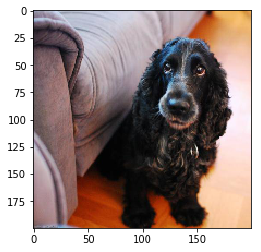

predicted:  pomeranian 0.334382
actual:  scottish_deerhound


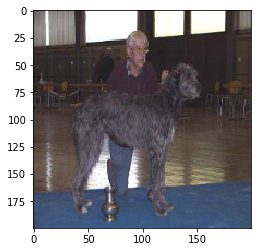

predicted:  maltese_dog 0.999136
actual:  pomeranian


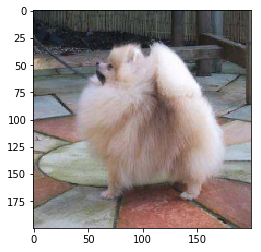

predicted:  maltese_dog 0.990429
actual:  scottish_deerhound


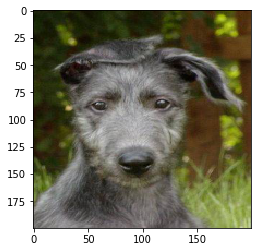

predicted:  pomeranian 0.993556
actual:  cocker_spaniel


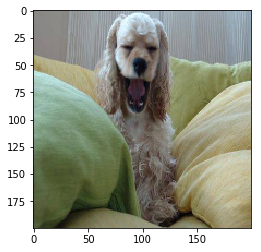

predicted:  cocker_spaniel 0.544603
actual:  scottish_deerhound


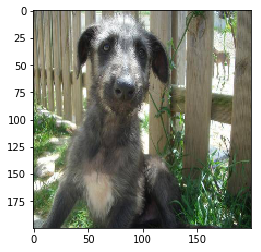

predicted:  scottish_deerhound 0.721344
actual:  pomeranian


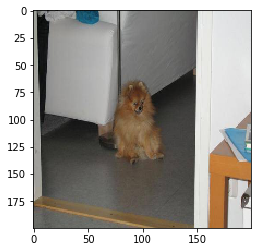

predicted:  maltese_dog 0.896795
actual:  cocker_spaniel


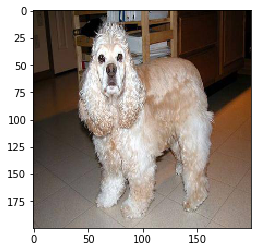

predicted:  maltese_dog 0.980904
actual:  pomeranian


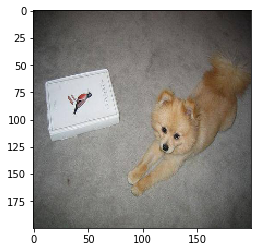

predicted:  maltese_dog 0.845273
actual:  pomeranian


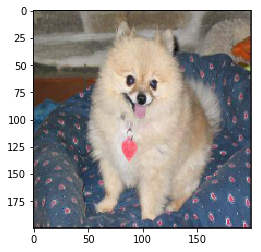

predicted:  pomeranian 0.750863
actual:  cocker_spaniel


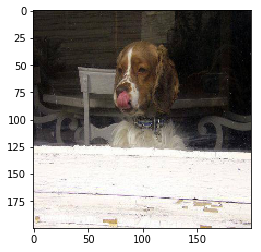

predicted:  scottish_deerhound 0.974993
actual:  cocker_spaniel


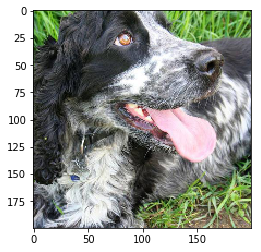

predicted:  scottish_deerhound 0.900748
actual:  pomeranian


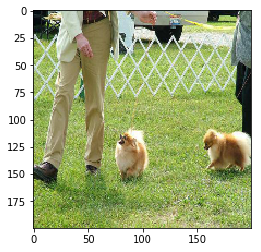

predicted:  cocker_spaniel 0.617214
actual:  scottish_deerhound


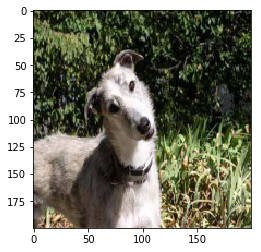

predicted:  scottish_deerhound 0.999002
actual:  pomeranian


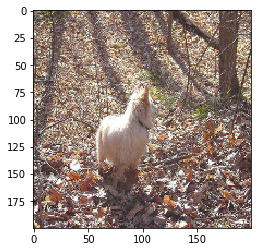

predicted:  maltese_dog 0.862461
actual:  pomeranian


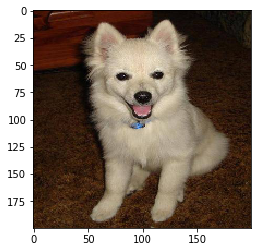

predicted:  pomeranian 0.581326
actual:  maltese_dog


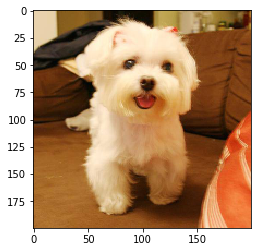

predicted:  maltese_dog 0.68885
actual:  cocker_spaniel


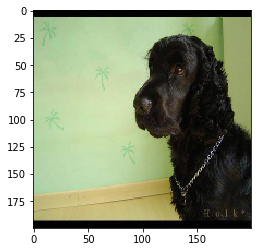

predicted:  scottish_deerhound 0.929901
actual:  cocker_spaniel


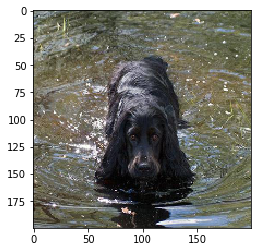

predicted:  cocker_spaniel 0.518925
actual:  scottish_deerhound


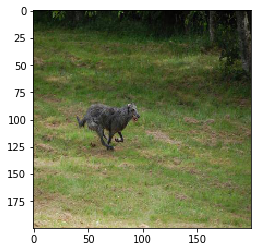

predicted:  pomeranian 0.921222
actual:  cocker_spaniel


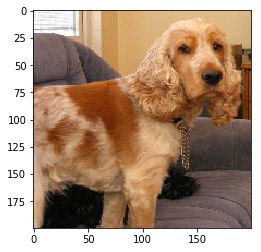

predicted:  scottish_deerhound 0.953211
actual:  cocker_spaniel


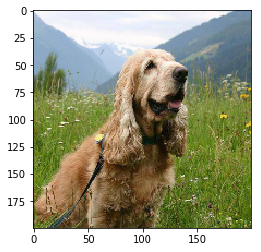

predicted:  maltese_dog 0.999753
actual:  pomeranian


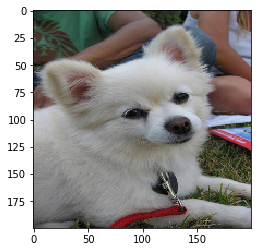

predicted:  scottish_deerhound 0.624852
actual:  maltese_dog


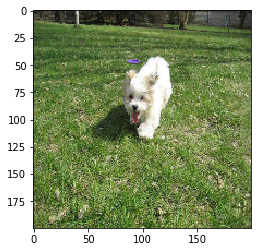

predicted:  pomeranian 0.984067
actual:  cocker_spaniel


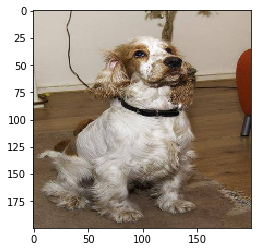

predicted:  maltese_dog 0.773795
actual:  scottish_deerhound


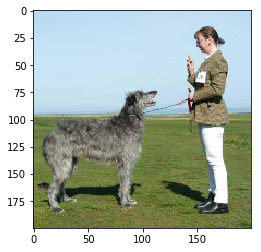

predicted:  pomeranian 0.856534
actual:  cocker_spaniel


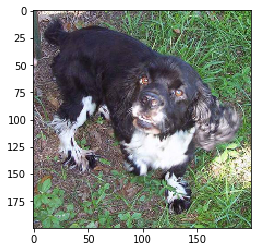

predicted:  cocker_spaniel 0.688238
actual:  scottish_deerhound


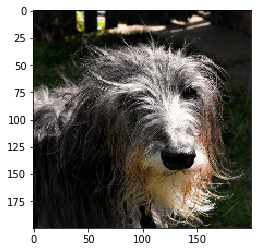

In [51]:
predicted_class = pred_prob.argmax(axis = 1) 
actual_class = y_valid_arr.argmax(axis = 1)
for i in range(predicted_class.shape[0]):
    pred_cls, act_cls = int(predicted_class[i]), int(actual_class[i])
    if pred_cls != act_cls:
        print('predicted: ', IDX_TO_BREED_MAP[pred_cls], pred_prob[i].max()) 
        print('actual: ', IDX_TO_BREED_MAP[int(actual_class[i])])
        plt.imshow(X_valid_arr[i].astype('uint8'))
        plt.show()

# Train for another 100 epochs to see if there's any improvement

In [ ]:
start = time.time()
num_round = 10
num_epochs_per_round = 10
print('Total Number of Epochs')
for i in range(num_round):
    print('Training Step: ', i)
    model.fit(X_train_arr_norm, y_train_arr, batch_size=32, epochs=num_epochs_per_round)
    pred_prob = model.predict_proba(X_valid_arr_norm)
    
    acc = (pred_prob.argmax(axis = 1) == y_valid_arr.argmax(axis = 1)).astype('float32').mean()
    loss = model.evaluate(X_valid_arr, y_valid_arr, batch_size=32)
    #print(pred_prob.round(3))
    print('Summary Stats on Predictions:')
    print(pred_prob.min(axis = 0))
    print(pred_prob.max(axis = 0))
    print(pred_prob.mean(axis = 0))
    print(pred_prob.std(axis = 0))
    print(make_confusion_matrix(pred_prob.argmax(axis = 1),  y_valid_arr.argmax(axis = 1), 4))
    print('Prediction Validation Accuracy and Loss', acc, loss)
print('Total Elapsed Time', time.time() - start)

Total Number of Epochs
Training Step:  0
Epoch 1/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2207
Epoch 2/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2739
Epoch 3/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2148
Epoch 4/10
342/342 [==============================] - 9s 25ms/step - loss: 0.1598
Epoch 5/10
342/342 [==============================] - 9s 25ms/step - loss: 0.1700
Epoch 6/10
342/342 [==============================] - 9s 25ms/step - loss: 0.1296
Epoch 7/10
342/342 [==============================] - 9s 25ms/step - loss: 0.1599
Epoch 8/10
342/342 [==============================] - 9s 25ms/step - loss: 0.1743
Epoch 9/10
342/342 [==============================] - 9s 25ms/step - loss: 0.2022
Epoch 10/10
86/86 [==============================] - 1s 7ms/step
Summary Stats on Predictions:
[  7.04191150e-11   1.68361520e-08   1.28630964e-08   1.54035606e-09]
[ 0.99997222  1.          0.99844885  0.99592566]
[ 0.36